***T5 Data Science Bootcamp***
# Predicting Churn Credit Card Customers

By Nouf Alotaibi
<br>
Email: noufmitla@gmail.com


### Table of Contents
- [Introduction](#Introduction)
- [Part I - Exploratory Data Analysis](#EDA)
- [Part II - Modeling](#Classification)
- [Part III - Feature Engineering](#FeatureEngineering)
- [Part IV - Experiments](#Experiments)
- [Part V - Conclusion](#Conclusion)

## Introduction

This is the third T5 Data Science Bootcamp project, which is about building classification models that address a useful prediction and/or interpretation problem using Python with Sklearn. Moreover, in this project, I will get familiar with Machine Learning modeling methods such as Logistic Regression, Decision Trees, Random Forest, and more to predict the customers in *Bank Unity* who will get churn and who will not.

In [1]:
# Munging imports
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport

# Visualization imports
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use("seaborn-whitegrid")

%matplotlib inline

# Modeling imports
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import confusion_matrix, precision_score, recall_score, accuracy_score, f1_score, fbeta_score, roc_auc_score, plot_roc_curve
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline


In [2]:
import imblearn.under_sampling
import imblearn.over_sampling
from imblearn.over_sampling import SMOTE

## Part I - Exploratory Data Analysis

### 1. Load Data

Load the dataset and exclude the last two columns, since that according to kaggle they are insignificant.

In [3]:
# Load the dataset
bank_df = pd.read_csv("BankChurners.csv").iloc[:,:-2]
bank_df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


### 2. Assess Data

In [4]:
# Print dataset information
print(f"- The dataset containes {bank_df.shape[0]} customer records with {bank_df.shape[1]} columns.")
print(f"\n- The columns data type:\n{bank_df.dtypes}") 
print(f"\n- Number of null values:\n{bank_df.isnull().sum()}")
print(f"\n- Number of unique values:\n{bank_df.nunique()}")

- The dataset containes 10127 customer records with 21 columns.

- The columns data type:
CLIENTNUM                     int64
Attrition_Flag               object
Customer_Age                  int64
Gender                       object
Dependent_count               int64
Education_Level              object
Marital_Status               object
Income_Category              object
Card_Category                object
Months_on_book                int64
Total_Relationship_Count      int64
Months_Inactive_12_mon        int64
Contacts_Count_12_mon         int64
Credit_Limit                float64
Total_Revolving_Bal           int64
Avg_Open_To_Buy             float64
Total_Amt_Chng_Q4_Q1        float64
Total_Trans_Amt               int64
Total_Trans_Ct                int64
Total_Ct_Chng_Q4_Q1         float64
Avg_Utilization_Ratio       float64
dtype: object

- Number of null values:
CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                  

In [5]:
# Print the unique values in columns
columns = ['Attrition_Flag','Customer_Age','Gender','Dependent_count','Education_Level',
           'Marital_Status','Income_Category','Card_Category','Months_on_book',
           'Total_Relationship_Count','Months_Inactive_12_mon','Contacts_Count_12_mon']

for col in columns:
    print(f"{col} unique values:\n{bank_df[col].unique()}\n")

Attrition_Flag unique values:
['Existing Customer' 'Attrited Customer']

Customer_Age unique values:
[45 49 51 40 44 32 37 48 42 65 56 35 57 41 61 47 62 54 59 63 53 58 55 66
 50 38 46 52 39 43 64 68 67 60 73 70 36 34 33 26 31 29 30 28 27]

Gender unique values:
['M' 'F']

Dependent_count unique values:
[3 5 4 2 0 1]

Education_Level unique values:
['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']

Marital_Status unique values:
['Married' 'Single' 'Unknown' 'Divorced']

Income_Category unique values:
['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']

Card_Category unique values:
['Blue' 'Gold' 'Silver' 'Platinum']

Months_on_book unique values:
[39 44 36 34 21 46 27 31 54 30 48 37 56 42 49 33 28 38 41 43 45 52 40 50
 35 47 32 20 29 25 53 24 55 23 22 26 13 51 19 15 17 18 16 14]

Total_Relationship_Count unique values:
[5 6 4 3 2 1]

Months_Inactive_12_mon unique values:
[1 4 2 3 6 0 5]

Contacts_Count_12_mon unique v

> Looks like the dataset doesn't contain null value. However, it containes **Unknown** values in the Education_Level, Marital_Status, and Income_Category columns.

In [6]:
# Print the number of Unknown values in Education_Level, Marital_Status, and Income_Category columns
print(f"Number of Unknown in Education_Level: {len(bank_df[bank_df['Education_Level']=='Unknown'])}")
print(f"Number of Unknown in Marital_Status: {len(bank_df[bank_df['Marital_Status']=='Unknown'])}")
print(f"Number of Unknown in Income_Category: {len(bank_df[bank_df['Income_Category']=='Unknown'])}")
print(f"Number of Unknown in Education_Level & Marital_Status & Income_Category: {len(bank_df[(bank_df['Education_Level']=='Unknown')&(bank_df['Marital_Status']=='Unknown')&(bank_df['Income_Category']=='Unknown')])}")

Number of Unknown in Education_Level: 1519
Number of Unknown in Marital_Status: 749
Number of Unknown in Income_Category: 1112
Number of Unknown in Education_Level & Marital_Status & Income_Category: 7


>So, we do are dealing with 10,127 records and 21 columns. We do not have nulls but on the other hand we do have 14%, 7% and 11% of 'Unknown' values in Education_Level, Marital_Status and Income_Category columns respectively. Also, we have a unique column which is the CLIENTNUM.
>
>We have 14 numerical columns (5 are float64, and 9 are int64) and 6 object. Since this dataset is relatively small and we do have the features names, we can make some assumptions (that would be verified): for example Gender, Marital_Status, Card_Category are expected to be nominal categorical features whereas Education_Level and Income_Category may be oridinal ones, the Customer_Age can also be transformed to oridinal values with age ranges.

In [7]:
# Overview of the dataset using Pandas Profiling Report
bank_df_profile = ProfileReport(bank_df)
bank_df_profile

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64


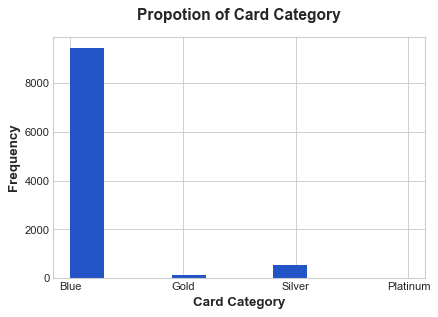

In [8]:
print(bank_df['Card_Category'].value_counts())
plt.figure(figsize=(6, 4), dpi=80)
plt.hist(bank_df['Card_Category'], color='#2254C5')
plt.title("Propotion of Card Category", fontsize=14, fontweight='bold', pad=15)
plt.ylabel("Frequency", fontsize=12, fontweight='bold')
plt.xlabel("Card Category", fontsize=12, fontweight='bold')
plt.show();

In [9]:
pd.crosstab(bank_df['Card_Category'], bank_df['Attrition_Flag'], margins=True, margins_name="Total")

Attrition_Flag,Attrited Customer,Existing Customer,Total
Card_Category,,,
Blue,1519,7917,9436
Gold,21,95,116
Platinum,5,15,20
Silver,82,473,555
Total,1627,8500,10127


F    5358
M    4769
Name: Gender, dtype: int64


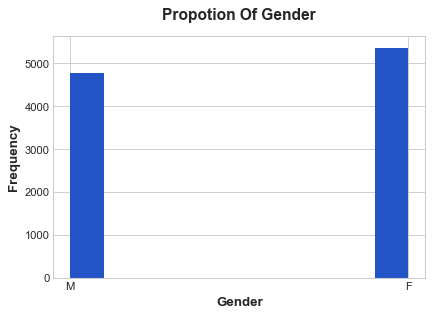

In [10]:
print(bank_df['Gender'].value_counts())
plt.figure(figsize=(6, 4), dpi=80)
plt.hist(bank_df['Gender'], color='#2254C5')
plt.title("Propotion Of Gender", fontsize=14, fontweight='bold', pad=15)
plt.ylabel("Frequency", fontsize=12, fontweight='bold')
plt.xlabel("Gender", fontsize=12, fontweight='bold')
plt.show();

In [11]:
pd.crosstab(bank_df['Gender'], bank_df['Attrition_Flag'], margins=True, margins_name="Total")

Attrition_Flag,Attrited Customer,Existing Customer,Total
Gender,,,
F,930,4428,5358
M,697,4072,4769
Total,1627,8500,10127


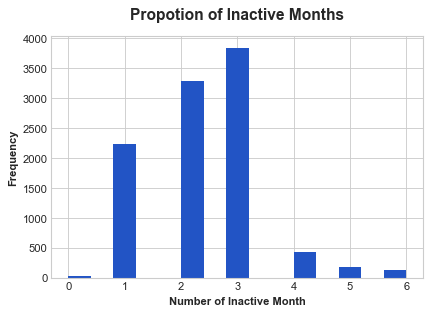

In [12]:
plt.figure(figsize=(6, 4), dpi=80)
plt.hist(bank_df['Months_Inactive_12_mon'], bins=15, color='#2254C5')
plt.title("Propotion of Inactive Months", fontsize=14, fontweight='bold', pad=15)
plt.ylabel("Frequency", fontweight='bold')
plt.xlabel("Number of Inactive Month", fontweight='bold')
plt.show();

In [13]:
pd.crosstab(bank_df['Months_Inactive_12_mon'], bank_df['Attrition_Flag'], margins=True, margins_name="Total")

Attrition_Flag,Attrited Customer,Existing Customer,Total
Months_Inactive_12_mon,,,
0,15,14,29
1,100,2133,2233
2,505,2777,3282
3,826,3020,3846
4,130,305,435
5,32,146,178
6,19,105,124
Total,1627,8500,10127


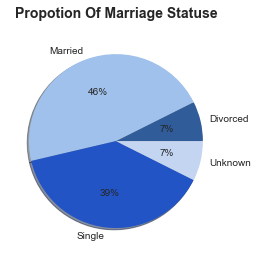

In [14]:
data = bank_df.groupby(['Marital_Status'])['CLIENTNUM'].count()
labels = data.index
colors = ['#305C99', '#A0C1EB', '#2254C5', '#C4D5F2']

plt.pie(data, labels=labels, colors=colors, autopct='%.0f%%', shadow=True)
plt.title("Propotion Of Marriage Statuse", fontsize=14, fontweight='bold', pad=15)
plt.show();

In [15]:
pd.crosstab(bank_df['Marital_Status'], bank_df['Attrition_Flag'], margins=True, margins_name="Total")

Attrition_Flag,Attrited Customer,Existing Customer,Total
Marital_Status,,,
Divorced,121,627,748
Married,709,3978,4687
Single,668,3275,3943
Unknown,129,620,749
Total,1627,8500,10127


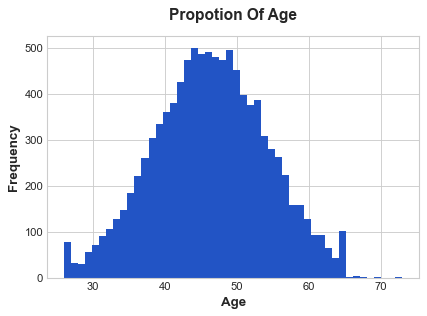

In [16]:
plt.figure(figsize=(6, 4), dpi=80)
plt.hist(bank_df['Customer_Age'], bins=48, color='#2254C5')
plt.title("Propotion Of Age", fontsize=14, fontweight='bold', pad=15)
plt.ylabel("Frequency", fontsize=12, fontweight='bold')
plt.xlabel("Age", fontsize=12, fontweight='bold')
plt.show();

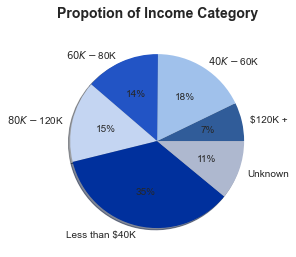

In [17]:
data = bank_df.groupby(['Income_Category'])['CLIENTNUM'].count()
labels = data.index
colors = ['#305C99', '#A0C1EB', '#2254C5', '#C4D5F2', '#00309D', '#AEB8CF']

plt.pie(data, labels=labels, colors=colors, autopct='%.0f%%', shadow=True)
plt.title("Propotion of Income Category", fontsize=14, fontweight='bold', pad=15)
plt.show();

/Users/noufeclat/opt/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


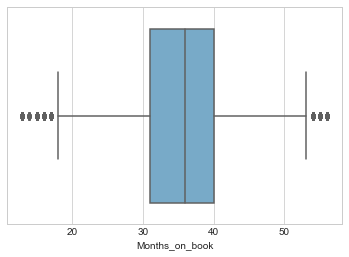

In [18]:
sns.boxplot(bank_df['Months_on_book'], palette="Blues");

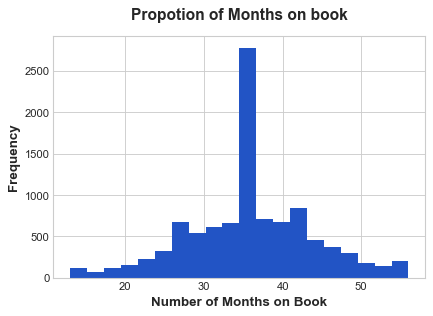

In [19]:
plt.figure(figsize=(6, 4), dpi=80)
plt.hist(bank_df['Months_on_book'], bins=20, color='#2254C5')
plt.title("Propotion of Months on book", fontsize=14, fontweight='bold', pad=15)
plt.ylabel("Frequency", fontsize=12, fontweight='bold')
plt.xlabel("Number of Months on Book", fontsize=12, fontweight='bold')
plt.show();

<AxesSubplot:>

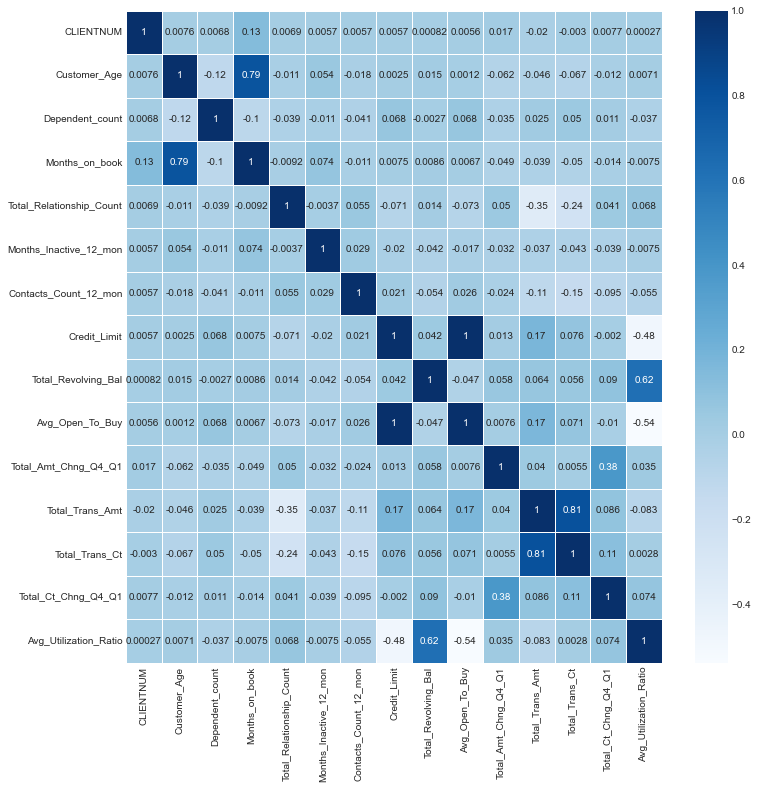

In [20]:
fig, ax = plt.subplots(figsize=(12,12))  
sns.heatmap(bank_df.corr(), cmap='Blues', annot=True, linewidths=.5, ax=ax)

Number of Existing Customer:8500
Number of Attrited Customer:1627



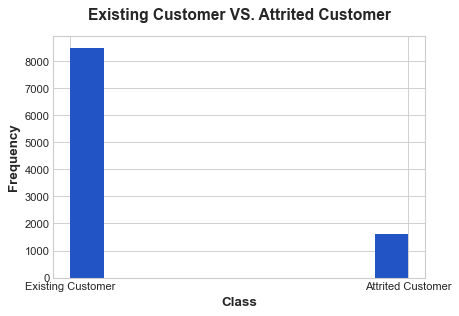

The event rate of Attrited Customer: 16.07


In [21]:
print(f"Number of Existing Customer:{bank_df['Attrition_Flag'].value_counts()[0]}")
print(f"Number of Attrited Customer:{bank_df['Attrition_Flag'].value_counts()[1]}\n")

plt.figure(figsize=(6, 4), dpi=80)
plt.hist(bank_df['Attrition_Flag'], color='#2254C5')
plt.title("Existing Customer VS. Attrited Customer", fontsize=14, fontweight='bold', pad=15)
plt.ylabel("Frequency", fontsize=12, fontweight='bold')
plt.xlabel("Class", fontsize=12, fontweight='bold')
plt.show();

rate = round((bank_df['Attrition_Flag'].value_counts()[1] / len(bank_df)) * 100, 2)
print(f"The event rate of Attrited Customer: {rate}")

> We can see here that there is an **imbalancement** in the target column Attrition_Flag. 

### 3. Clean Data

- Drop the CLIENTNUM column, since it is unique.

In [22]:
bank_df = bank_df.drop(columns = ['CLIENTNUM'])
bank_df.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

- Drop the records that have **Unknown** values in Education_Level, Marital_Status, and Income_Category columns.

In [23]:
bank_df = bank_df[~((bank_df['Education_Level']=='Unknown') & 
                    (bank_df['Marital_Status']=='Unknown') & 
                    (bank_df['Income_Category']=='Unknown'))]
bank_df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


- Convert the target column Attrition_Flag to 1's and 0's. (1 = Attrited Customer, 0 = Existing Customer)

In [24]:
bank_df['Attrition_Flag'] = bank_df['Attrition_Flag'].apply(lambda x: 1 if x=='Attrited Customer' else 0)
bank_df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


## Part II - Modeling

In [25]:
num_cols = bank_df.select_dtypes(include=np.number).columns.to_list()
cat_cols = bank_df.select_dtypes(exclude=np.number).columns.to_list()

In [66]:
cat_cols

['Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category']

### Helper Functions

#### 1. Splitting Data Functions


In [26]:
def SplitData(bank_df, cv=False):
    """
    Description: if cv=True, it splits the data into %90 train, and %10 test, else it splits the data into %75 train, %15 validation, and %10 test.
    Input: dataframe.
    Return: train, validation, and test dataframes.
    
    """ 
    bank_df_X = bank_df.drop(columns=['Attrition_Flag'])
    bank_df_y = bank_df['Attrition_Flag']
    
    # %90 train, and %10 test
    if cv:
        train_ratio = 0.90
        
        X_train, X_test, y_train, y_test = train_test_split(bank_df_X, bank_df_y, test_size=1-train_ratio, random_state=42, shuffle=True)
        return X_train, y_train, X_test, y_test
    
    # %75 train, %15 validation, and %10 test
    else: 
        train_ratio = 0.75
        validation_ratio = 0.15
        test_ratio = 0.10
        
        X_train, X_test, y_train, y_test = train_test_split(bank_df_X, bank_df_y, test_size=1-train_ratio, random_state=42, shuffle=True)
        X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=test_ratio/(test_ratio+validation_ratio), random_state=42, shuffle=True) 
        return X_train, y_train, X_val, y_val, X_test, y_test

#### 2. Modeling Functions


In [27]:
def LogisticRegression_model(X_train, y_train, X_val, y_val, class_weight=None, max_iter=200, cm=False, drop_cat=True):
    """
    Description: it models logistic regression using the train data, and print scores for both train and validation data.
    Input: train data, val data.
    Return: trained logistic regression model.

    """
    if drop_cat: 
        X_train = X_train.drop(columns=cat_cols)
        X_val = X_val.drop(columns=cat_cols)
            
    LR = LogisticRegression(class_weight=class_weight, max_iter=max_iter, random_state=42)
    LR.fit(X_train, y_train)
    
    print("Train Scores:")
    preds = LR.predict(X_train)
    ModelScores(y_train, preds)
    
    print("\n-----------------------------------------------")
    
    print("\nValidation Scores:")
    preds_val = LR.predict(X_val)
    ModelScores(y_val, preds_val)
    
    if cm:
        ConfusionMatrix(y_val, preds_val)
    return LR

#----------------------------------------------------------------------------

def RandomForest_model(X_train, y_train, X_val, y_val, n_estimators, cm=False, drop_cat=True):
    """
    Description: it models random rorest using the train data, and print scores for both train and validation data.
    Input: train data, val data, n_estimators.
    Return: trained random rorest model.

    """
    
    if drop_cat: 
        X_train = X_train.drop(columns=cat_cols)
        X_val = X_val.drop(columns=cat_cols)

    RF = RandomForestClassifier(n_estimators=n_estimators)
    RF.fit(X_train, y_train)

    print("Train Scores:")
    preds = RF.predict(X_train)
    ModelScores(y_train, preds)
    
    print("\n-----------------------------------------------")
    
    print("\nValidation Scores:")    
    preds_val = RF.predict(X_val)
    ModelScores(y_val, preds_val)
    
    if cm:
        ConfusionMatrix(y_val, preds_val)
    return RF

#----------------------------------------------------------------------------

def AdaBoost(X_train, y_train, X_val, y_val, n_estimators, cm=False, drop_cat=True):
    """
    Description: 
    Input: train data, val data, n_estimators.
    Return: trained ada boost model.

    """
    
    if drop_cat: 
        X_train = X_train.drop(columns=cat_cols)
        X_val = X_val.drop(columns=cat_cols)

    ADA = AdaBoostClassifier(n_estimators=n_estimators, random_state=42)
    ADA.fit(X_train, y_train)

    print("Train Scores:")
    preds = ADA.predict(X_train)
    ModelScores(y_train, preds)
    
    print("\n-----------------------------------------------")
    
    print("\nValidation Scores:")    
    preds_val = ADA.predict(X_val)
    ModelScores(y_val, preds_val)
    
    if cm:
        ConfusionMatrix(y_val, preds_val)
    return ADA 

#----------------------------------------------------------------------------

def DecisionTree_model(X_train, y_train, X_val, y_val, cm=False, drop_cat=True):

    
    
    if drop_cat: 
        X_train = X_train.drop(columns=cat_cols)
        X_val = X_val.drop(columns=cat_cols)

    DT = DecisionTreeClassifier(random_state=42)
    DT.fit(X_train, y_train)

    print("Train Scores:")
    preds = DT.predict(X_train)
    ModelScores(y_train, preds)
    
    print("\n-----------------------------------------------")
    
    print("\nValidation Scores:")    
    preds_val = DT.predict(X_val)
    ModelScores(y_val, preds_val)
    
    if cm:
        ConfusionMatrix(y_val, preds_val)
    return DT 

In [28]:
def pipelines(clf, X_train, y_train, cv=5):
    
    scores = ['recall', 'precision', 'f1']
    pipe_scores = {}
    
    if(clf == "DecisionTreeClassifier"):
        pipe = Pipeline(steps=[('scale', StandardScaler()), ("RF", DecisionTreeClassifier(random_state=42))])
        
    elif(clf == "RandomForestClassifier"):
        pipe = Pipeline(steps=[('scale', StandardScaler()), ("RF", RandomForestClassifier(random_state=42))])
    
    elif(clf == "AdaBoostClassifier"):
        pipe = Pipeline(steps=[('scale',StandardScaler()), ("RF", AdaBoostClassifier(random_state=42, learning_rate=0.7))])
        
    else:
        pipe = Pipeline(steps=[('scale',StandardScaler()), ("RF", SVC(random_state=42, kernel='rbf'))])
        
    for score in scores:
        pipe_scores[score] = cross_val_score(pipe, X_train, y_train, cv=cv, scoring=score)
    
    return pipe, pipe_scores

#### 3. Model Performance Metrics Functions


In [29]:
def ModelScores(actual, preds, bta = 2):
    """
    Description: it scores the model print accuracy, precision, recall, f1, and fbeta scores.
    Input: actual target, prediction targets.
    Return: fbeta.
    
    """  
    
    print("- Accuracy score: ", accuracy_score(actual, preds))
    print("- F-1 score: ", f1_score(actual, preds))
    print("- Precision score: ", precision_score(actual, preds))
    print("- Recall score: ", recall_score(actual, preds))
    print("- F-beta of", bta, "score: ", fbeta_score(actual, preds, beta=bta))

#----------------------------------------------------------------------------

def ConfusionMatrix(actual, preds):
    """
    Description: prints confusion matrix.
    Input: 
    Return: confusion matrix.

    """
    
    cm = confusion_matrix(actual, preds)
    plt.figure(dpi=150)
    sns.heatmap(cm, cmap=plt.cm.Blues, annot=True, square=True, xticklabels=[0,1], yticklabels=[0,1], fmt='g')

    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix');
    return cm


#### 4. Handling Imbalanced Data Functions

In [30]:
def UnderSampling(X, y):
    """
    Description: random undersampling to balance class distribution by randomly eliminating majority class.
    Input: X, y.
    Return: X, y after random undersampling.

    """
#     if drop_cat: 
#         X = X.drop(columns=cat_cols)
        
    under_sampler = imblearn.under_sampling.RandomUnderSampler()
    X_us, y_us = under_sampler.fit_resample(X, y)
    return X_us, y_us

#----------------------------------------------------------------------------

def OverSampling(X, y):
    """
    Description: random over-sampling increases the number of instances in the minority class by randomly replicating them.
    Input: X, y.
    Return: X, y after random over-sampling.

    """
#     if drop_cat: 
#         X = X.drop(columns=cat_cols)
        
    over_sampler = imblearn.over_sampling.RandomOverSampler()
    X_up, y_up = over_sampler.fit_resample(X, y)
    return X_up, y_up

#----------------------------------------------------------------------------

def SMOTESampling(X, y):
    """
    Description: takes a subset from the minority class, then creates a synthetic instances and adds them to the original dataset.
    Input: X, y.
    Return: X, y after SMOTE sampling.

    """
#     if drop_cat: 
#         X = X.drop(columns=cat_cols)
        
    smote_sampler = SMOTE(random_state=42, n_jobs=-1)
    X_sm, y_sm = smote_sampler.fit_resample(X, y)
    return X_sm, y_sm

### Split the data into train, validation, and test

In [31]:
X_train, y_train, X_val, y_val, X_test, y_test = SplitData(bank_df)

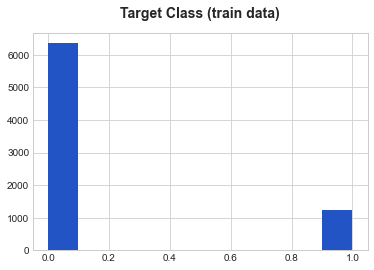

In [32]:
plt.hist(y_train, color='#2254C5')
plt.title("Target Class (train data)", fontsize=14, fontweight='bold', pad=15)
plt.show();

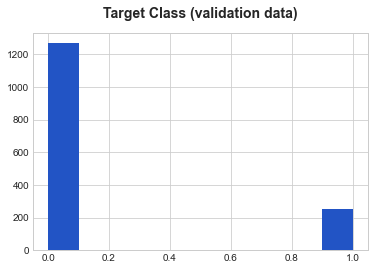

In [33]:
plt.hist(y_val, color='#2254C5')
plt.title("Target Class (validation data)", fontsize=14, fontweight='bold', pad=15)
plt.show();

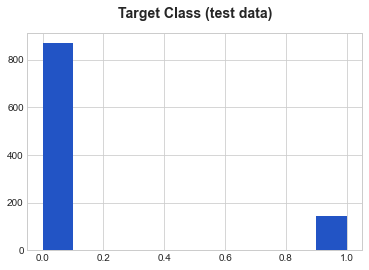

In [34]:
plt.hist(y_test, color='#2254C5')
plt.title("Target Class (test data)", fontsize=14, fontweight='bold', pad=15)
plt.show();

> The **imbalancment** exists in all of the train, validation, and test sets.

### Split the data into train, and test

In [35]:
X_train_cv, y_train_cv, X_test_cv, y_test_cv = SplitData(bank_df, cv=True)

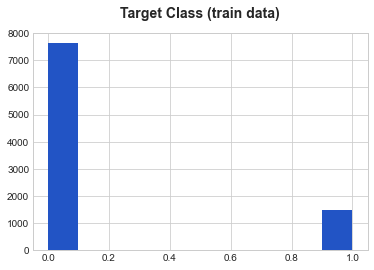

In [36]:
plt.hist(y_train_cv, color='#2254C5')
plt.title("Target Class (train data)", fontsize=14, fontweight='bold', pad=15)
plt.show();

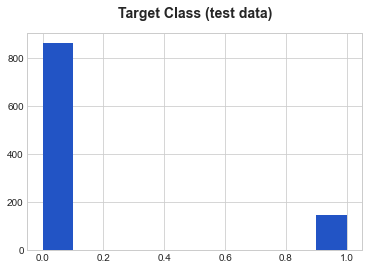

In [37]:
plt.hist(y_test_cv, color='#2254C5')
plt.title("Target Class (test data)", fontsize=14, fontweight='bold', pad=15)
plt.show();

> The **imbalancment** exists in both of the train and test sets.

### Baseline Model - Logistic Regression

Train Scores:
- Accuracy score:  0.8878787878787879
- F-1 score:  0.5882922109337204
- Precision score:  0.7281437125748503
- Recall score:  0.4935064935064935
- F-beta of 2 score:  0.5275030366128752

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.8814229249011858
- F-1 score:  0.5631067961165048
- Precision score:  0.7204968944099379
- Recall score:  0.46215139442231074
- F-beta of 2 score:  0.49785407725321884


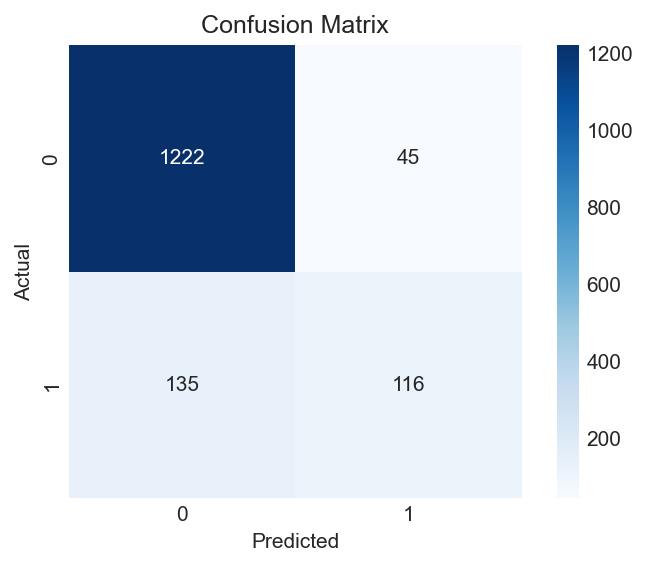

In [38]:
lg_model = LogisticRegression_model(X_train, y_train, X_val, y_val, cm=True)

> Since we know that there is an **imbalancment** in the target which is the *Attrition_Flag*, the **accouracy** score is not an appropriate measure to evaluate model performance. For eg: A classifier which achieves an accuracy of %88 with an event rate of %16 is not accurate, if it classifies all instances as the majority class. And eliminates the %16 minority class observations as noise.
>
> Also, we can see that there is a lot of **TN**'s, and that is why the accouracy score is so high in both test and validation sets. 

> In our case, the cost of False Negatives is much higher than the cost of False Positives. The cost of a customer who is actually an attrited customer and got predicted by the model as an existing custmer is high, and the bank will lose them since they will not be able to provide better services for them. Therefore, we want to decrease the FN's to increase recall.
>
> F-Measure provides a single score that balances both the concerns of precision and recall in one number. A good F1 score means that you have low false positives and low false negatives, so you’re correctly identifying real threats, and you are not disturbed by false alarms. An F1 score is considered perfect when it’s 1, while the model is a total failure when it’s 0.
>
> Since the priority is to minimize false negatives, we would want to select a beta value of >1 for the F-beta score. Recall would be considered more important than precision in this scenario.

## Part III - Feature Engineering

#### 1. Convert Gender values into 0's and 1's

In [39]:
# Train set
X_train['Gender'] = X_train['Gender'].apply(lambda x: 1 if x=='F' else 0)
X_train_cv['Gender'] = X_train_cv['Gender'].apply(lambda x: 1 if x=='F' else 0)


# Validation set
X_val['Gender'] = X_val['Gender'].apply(lambda x: 1 if x=='F' else 0)

# Test set
X_test['Gender'] = X_test['Gender'].apply(lambda x: 1 if x=='F' else 0)
X_test_cv['Gender'] = X_test_cv['Gender'].apply(lambda x: 1 if x=='F' else 0)

#### 2. Factorize categorical columns 

In [40]:
# Train set
X_train[cat_cols] = X_train[cat_cols].apply(lambda x : pd.factorize(x)[0])
X_train_cv[cat_cols] = X_train_cv[cat_cols].apply(lambda x : pd.factorize(x)[0])


# Validation set
X_val[cat_cols] = X_val[cat_cols].apply(lambda x : pd.factorize(x)[0])

# Test set
X_test[cat_cols] = X_test[cat_cols].apply(lambda x : pd.factorize(x)[0])
X_test_cv[cat_cols] = X_test_cv[cat_cols].apply(lambda x : pd.factorize(x)[0])

#### 2. Convert categorical columns to dummy variables

In [41]:
# # Train set
# bank_df_fe_dummy_1 = pd.get_dummies(X_train['Education_Level']).drop(columns=['Unknown'],axis=1)
# X_train = pd.concat([X_train, bank_df_fe_dummy_1], axis=1)

# # Validation set
# bank_df_fe_dummy_1 = pd.get_dummies(X_val['Education_Level']).drop(columns=['Unknown'],axis=1)
# X_val = pd.concat([X_val, bank_df_fe_dummy_1], axis=1)


# #-----------------------------

# # Train set
# bank_df_fe_dummy_2 = pd.get_dummies(X_train['Marital_Status']).drop(columns=['Unknown'],axis=1)
# X_train = pd.concat([X_train, bank_df_fe_dummy_2], axis=1)

# # Validation set
# bank_df_fe_dummy_2 = pd.get_dummies(X_val['Marital_Status']).drop(columns=['Unknown'],axis=1)
# X_val = pd.concat([X_val, bank_df_fe_dummy_2], axis=1)

# #-----------------------------

# # Train set
# bank_df_fe_dummy_3 = pd.get_dummies(X_train['Income_Category']).drop(columns=['Unknown'],axis=1)
# X_train = pd.concat([X_train, bank_df_fe_dummy_3], axis=1)

# # Validation set
# bank_df_fe_dummy_3 = pd.get_dummies(X_val['Income_Category']).drop(columns=['Unknown'],axis=1)
# X_val = pd.concat([X_val, bank_df_fe_dummy_3], axis=1)

# #-----------------------------

# # Train set
# bank_df_fe_dummy_4 = pd.get_dummies(X_train['Card_Category'])
# X_train = pd.concat([X_train, bank_df_fe_dummy_4], axis=1)

# # Validation set
# bank_df_fe_dummy_4 = pd.get_dummies(X_val['Card_Category'])
# X_val = pd.concat([X_val, bank_df_fe_dummy_4], axis=1)


## Part IV - Experiments

### Approaches to handling Imbalanced Data
1. Resampling Techniques
2. Bagging Based techniques
3. Boosting-Based techniques

#### Experiment: Resampling Techniques (Random Under-Sampling)

In [42]:
# Resampling Techniques: Random Under-Sampling
X_us, y_us = UnderSampling(X_train, y_train)

train_under_sampler = pd.concat([X_us, y_us], axis=1)
train_under_sampler['Attrition_Flag'].value_counts()

0    1232
1    1232
Name: Attrition_Flag, dtype: int64

In [43]:
print("Logistic Regression With Random Under-Sampling\n")
lg_under_sampler_model = LogisticRegression_model(X_us, y_us, X_val, y_val, drop_cat=False)

Logistic Regression With Random Under-Sampling

Train Scores:
- Accuracy score:  0.8234577922077922
- F-1 score:  0.823242584315319
- Precision score:  0.8242473555736372
- Recall score:  0.8222402597402597
- F-beta of 2 score:  0.8226408965405231

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.8148880105401844
- F-1 score:  0.5933429811866859
- Precision score:  0.4659090909090909
- Recall score:  0.8167330677290837
- F-beta of 2 score:  0.7098337950138506


In [44]:
print("Decision Tree With Random Under-Sampling\n")
dt_under_sampler_model = DecisionTree_model(X_us, y_us, X_val, y_val, drop_cat=False)

Decision Tree With Random Under-Sampling

Train Scores:
- Accuracy score:  1.0
- F-1 score:  1.0
- Precision score:  1.0
- Recall score:  1.0
- F-beta of 2 score:  1.0

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.9044795783926218
- F-1 score:  0.7611202635914333
- Precision score:  0.648876404494382
- Recall score:  0.9203187250996016
- F-beta of 2 score:  0.8492647058823529


In [45]:
print("Random Forest With Random Under-Sampling\n")
rf_under_sampler_model = RandomForest_model(X_us, y_us, X_val, y_val, n_estimators=100, drop_cat=False)

Random Forest With Random Under-Sampling

Train Scores:
- Accuracy score:  1.0
- F-1 score:  1.0
- Precision score:  1.0
- Recall score:  1.0
- F-beta of 2 score:  1.0

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.9374176548089591
- F-1 score:  0.8370497427101201
- Precision score:  0.7349397590361446
- Recall score:  0.9721115537848606
- F-beta of 2 score:  0.9131736526946109


In [46]:
print("Ada Boost With Random Under-Sampling\n")
ada_under_sampler_model = AdaBoost(X_us, y_us, X_val, y_val, n_estimators=100, drop_cat=False)

Ada Boost With Random Under-Sampling

Train Scores:
- Accuracy score:  0.9602272727272727
- F-1 score:  0.9603559870550161
- Precision score:  0.957258064516129
- Recall score:  0.963474025974026
- F-beta of 2 score:  0.9622243839169908

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.9347826086956522
- F-1 score:  0.8253968253968254
- Precision score:  0.740506329113924
- Recall score:  0.9322709163346613
- F-beta of 2 score:  0.8863636363636364


/Users/noufeclat/opt/anaconda3/lib/python3.7/site-packages/sklearn/base.py:442: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  "X does not have valid feature names, but"
/Users/noufeclat/opt/anaconda3/lib/python3.7/site-packages/sklearn/base.py:442: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  "X does not have valid feature names, but"


#### Experiment: Resampling Techniques (Random Over-Sampling)

In [47]:
# Resampling Techniques: Random Over-Sampling
X_up, y_up = OverSampling(X_train, y_train)

train_over_sampler = pd.concat([X_up, y_up], axis=1)
train_over_sampler['Attrition_Flag'].value_counts()

0    6358
1    6358
Name: Attrition_Flag, dtype: int64

In [48]:
print("Logistic Regression With Random Over-Sampling\n")
lg_over_sampler_model = LogisticRegression_model(X_up, y_up, X_val, y_val, drop_cat=False)

Logistic Regression With Random Over-Sampling

Train Scores:
- Accuracy score:  0.8278546712802768
- F-1 score:  0.8282463711259317
- Precision score:  0.8263660560513543
- Recall score:  0.8301352626612142
- F-beta of 2 score:  0.829378673119834

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.8148880105401844
- F-1 score:  0.59568345323741
- Precision score:  0.46621621621621623
- Recall score:  0.8247011952191236
- F-beta of 2 score:  0.714779005524862


/Users/noufeclat/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


In [49]:
print("Decision Tree With Random Over-Sampling\n")
dt_over_sampler_model = LogisticRegression_model(X_up, y_up, X_val, y_val, drop_cat=False)

Decision Tree With Random Over-Sampling

Train Scores:
- Accuracy score:  0.8278546712802768
- F-1 score:  0.8282463711259317
- Precision score:  0.8263660560513543
- Recall score:  0.8301352626612142
- F-beta of 2 score:  0.829378673119834

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.8148880105401844
- F-1 score:  0.59568345323741
- Precision score:  0.46621621621621623
- Recall score:  0.8247011952191236
- F-beta of 2 score:  0.714779005524862


/Users/noufeclat/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


In [50]:
print("Random Forest With Random Over-Sampling\n")
rf_over_sampler_model = LogisticRegression_model(X_up, y_up, X_val, y_val, drop_cat=False)

Random Forest With Random Over-Sampling

Train Scores:
- Accuracy score:  0.8278546712802768
- F-1 score:  0.8282463711259317
- Precision score:  0.8263660560513543
- Recall score:  0.8301352626612142
- F-beta of 2 score:  0.829378673119834

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.8148880105401844
- F-1 score:  0.59568345323741
- Precision score:  0.46621621621621623
- Recall score:  0.8247011952191236
- F-beta of 2 score:  0.714779005524862


/Users/noufeclat/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


In [51]:
print("Ada Boost With Random Over-Sampling\n")
ada_over_sampler_model = LogisticRegression_model(X_up, y_up, X_val, y_val, drop_cat=False)

Ada Boost With Random Over-Sampling

Train Scores:
- Accuracy score:  0.8278546712802768
- F-1 score:  0.8282463711259317
- Precision score:  0.8263660560513543
- Recall score:  0.8301352626612142
- F-beta of 2 score:  0.829378673119834

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.8148880105401844
- F-1 score:  0.59568345323741
- Precision score:  0.46621621621621623
- Recall score:  0.8247011952191236
- F-beta of 2 score:  0.714779005524862


/Users/noufeclat/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


#### Experiment: Resampling Techniques (Synthetic Minority Over-sampling Technique (SMOTE))

In [52]:
# Resampling Techniques: Synthetic Minority Over-sampling Technique (SMOTE)
X_sm, y_sm = SMOTESampling(X_train, y_train)

train_SMOTE_sampler = pd.concat([X_sm, y_sm], axis=1)
train_SMOTE_sampler['Attrition_Flag'].value_counts()

0    6358
1    6358
Name: Attrition_Flag, dtype: int64

In [53]:
print("Logistic Regression With SMOTE\n")
lg_SMOTE_sampler_model = LogisticRegression_model(X_sm, y_sm, X_val, y_val, drop_cat=False)

Logistic Regression With SMOTE

Train Scores:
- Accuracy score:  0.8188109468386285
- F-1 score:  0.817894404046791
- Precision score:  0.8220527486495075
- Recall score:  0.813777917584146
- F-beta of 2 score:  0.8154195297232556

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.8063241106719368
- F-1 score:  0.5701754385964912
- Precision score:  0.4503464203233256
- Recall score:  0.7768924302788844
- F-beta of 2 score:  0.6784968684759916


/Users/noufeclat/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


In [54]:
print("Decision Tree With SMOTE\n")
dt_SMOTE_sampler_model = DecisionTree_model(X_sm, y_sm, X_val, y_val, drop_cat=False)

Decision Tree With SMOTE

Train Scores:
- Accuracy score:  1.0
- F-1 score:  1.0
- Precision score:  1.0
- Recall score:  1.0
- F-beta of 2 score:  1.0

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.9163372859025033
- F-1 score:  0.7686703096539163
- Precision score:  0.7080536912751678
- Recall score:  0.8406374501992032
- F-beta of 2 score:  0.8102918586789555


In [55]:
print("Random Forest With SMOTE\n")
rf_SMOTE_sampler_model = RandomForest_model(X_sm, y_sm, X_val, y_val, n_estimators=100, drop_cat=False)

Random Forest With SMOTE

Train Scores:
- Accuracy score:  1.0
- F-1 score:  1.0
- Precision score:  1.0
- Recall score:  1.0
- F-beta of 2 score:  1.0

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.9552042160737813
- F-1 score:  0.870722433460076
- Precision score:  0.8327272727272728
- Recall score:  0.9123505976095617
- F-beta of 2 score:  0.8952306489444879


In [56]:
print("Ada Boost With SMOTE\n")
ada_SMOTE_sampler_model = AdaBoost(X_sm, y_sm, X_val, y_val, n_estimators=100, drop_cat=False)

Ada Boost With SMOTE

Train Scores:
- Accuracy score:  0.9634318968229003
- F-1 score:  0.9635836792231184
- Precision score:  0.9596006863203869
- Recall score:  0.9675998741742686
- F-beta of 2 score:  0.9659893854222279

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.9380764163372859
- F-1 score:  0.8297101449275363
- Precision score:  0.760797342192691
- Recall score:  0.9123505976095617
- F-beta of 2 score:  0.8773946360153257


/Users/noufeclat/opt/anaconda3/lib/python3.7/site-packages/sklearn/base.py:442: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  "X does not have valid feature names, but"
/Users/noufeclat/opt/anaconda3/lib/python3.7/site-packages/sklearn/base.py:442: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  "X does not have valid feature names, but"


### Feature Importance

In [57]:
rf_SMOTE_sampler_model.feature_importances_

array([0.02739879, 0.00580785, 0.00906561, 0.00854987, 0.00624629,
       0.01570054, 0.00201514, 0.01780009, 0.06343101, 0.01527598,
       0.01345124, 0.02855267, 0.1046599 , 0.02944819, 0.05540353,
       0.21720115, 0.22899997, 0.08944429, 0.06154791])

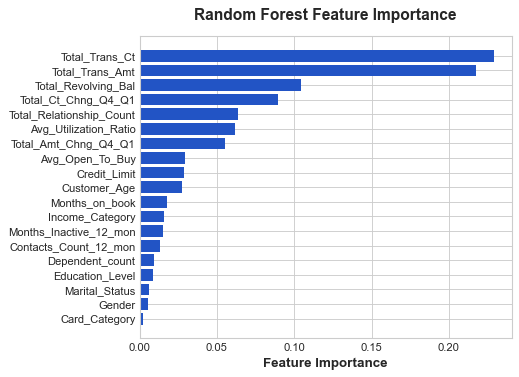

In [58]:
sorted_idx = rf_SMOTE_sampler_model.feature_importances_.argsort()
plt.figure(figsize=(6, 5), dpi=80)
plt.barh(X_sm.columns[sorted_idx], rf_SMOTE_sampler_model.feature_importances_[sorted_idx], color='#2254C5')
plt.xlabel("Feature Importance", fontsize=12, fontweight='bold')
plt.title("Random Forest Feature Importance", fontsize=14, fontweight='bold', pad=15)
plt.show();

In [59]:
fi_cols = ['Gender', 'Card_Category', 'Marital_Status']

print("Random Forest With SMOTE After Feature Selection\n")
rf_SMOTE_sampler_model = RandomForest_model(X_sm.drop(columns=fi_cols), y_sm, X_val.drop(columns=fi_cols), y_val, n_estimators=100, drop_cat=False)

Random Forest With SMOTE After Feature Selection

Train Scores:
- Accuracy score:  1.0
- F-1 score:  1.0
- Precision score:  1.0
- Recall score:  1.0
- F-beta of 2 score:  1.0

-----------------------------------------------

Validation Scores:
- Accuracy score:  0.9565217391304348
- F-1 score:  0.8759398496240601
- Precision score:  0.8291814946619217
- Recall score:  0.9282868525896414
- F-beta of 2 score:  0.9066147859922179


### ROC Curve

In [60]:
X_sm, y_sm = SMOTESampling(X_train, y_train)

train_SMOTE_sampler = pd.concat([X_sm, y_sm], axis=1)
train_SMOTE_sampler['Attrition_Flag'].value_counts()

0    6358
1    6358
Name: Attrition_Flag, dtype: int64

In [61]:
classifiers = [
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5),
    AdaBoostClassifier(),
    LogisticRegression()]

/Users/noufeclat/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/noufeclat/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/Users/noufeclat/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_

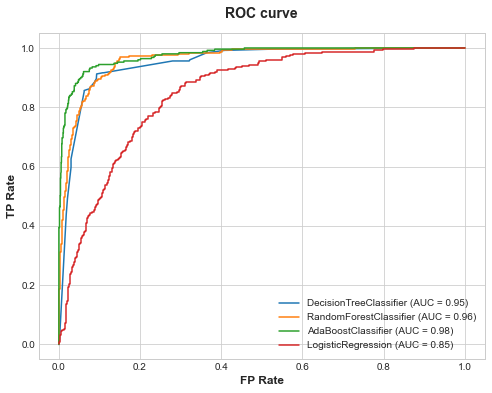

In [62]:
fig, ax = plt.subplots(figsize=(8,6))

model_displays = {}
for clf in classifiers:
    clf.fit(X_sm, y_sm)
    name = type(clf).__name__
    model_displays[type(clf).__name__] = plot_roc_curve(clf, X_val, y_val, ax=ax, name=name)
    ax.set_title('ROC curve', fontsize=14, fontweight='bold', pad=15)
    ax.set_xlabel("FP Rate", fontsize=12, fontweight='bold')
    ax.set_ylabel("TP Rate", fontsize=12, fontweight='bold')

### Cross Validation

In [63]:
X_sm_cv, y_sm_cv = SMOTESampling(X_train_cv, y_train_cv)

train_SMOTE_sampler = pd.concat([X_sm_cv, y_sm_cv], axis=1)
train_SMOTE_sampler['Attrition_Flag'].value_counts()

0    7631
1    7631
Name: Attrition_Flag, dtype: int64

#### Create piplines for Decision Tree Classifier, Random Forest Classifier, Ada Boost Classifier

In [64]:
dt_pipe, dt_pipe_scores = pipelines("DecisionTreeClassifier", X_sm_cv, y_sm_cv, cv=5)
rf_pipe, rf_pipe_scores = pipelines("RandomForestClassifier", X_sm_cv.drop(columns=fi_cols), y_sm_cv, cv=5)
ada_pipe, ada_pipe_scores = pipelines("AdaBoostClassifier", X_sm_cv, y_sm_cv, cv=5)

In [65]:
dt_pipe.fit(X_sm_cv, y_sm_cv)
dt_pipe_prediction = dt_pipe.predict(X_test_cv)
print("DecisionTreeClassifier Pipline\n")
ModelScores(y_test_cv, dt_pipe_prediction)

print("-----------------------")

rf_pipe.fit(X_sm_cv.drop(columns=fi_cols), y_sm_cv)
rf_pipe_prediction = rf_pipe.predict(X_test_cv.drop(columns=fi_cols))
print("\nRandomForestClassifier Pipline\n")
ModelScores(y_test_cv, rf_pipe_prediction)

print("-----------------------")

ada_pipe.fit(X_sm_cv, y_sm_cv)
ada_pipe_prediction = ada_pipe.predict(X_test_cv)
print("\nAdaBoostClassifier Pipline\n")
ModelScores(y_test_cv, ada_pipe_prediction)

DecisionTreeClassifier Pipline

- Accuracy score:  0.9239130434782609
- F-1 score:  0.7687687687687687
- Precision score:  0.6956521739130435
- Recall score:  0.8590604026845637
- F-beta of 2 score:  0.8205128205128205
-----------------------

RandomForestClassifier Pipline

- Accuracy score:  0.9446640316205533
- F-1 score:  0.8250000000000001
- Precision score:  0.7719298245614035
- Recall score:  0.8859060402684564
- F-beta of 2 score:  0.8604954367666232
-----------------------

AdaBoostClassifier Pipline

- Accuracy score:  0.91600790513834
- F-1 score:  0.7632311977715877
- Precision score:  0.6523809523809524
- Recall score:  0.9194630872483222
- F-beta of 2 score:  0.8498759305210918


## Part V - Conclusion

> - Classifier Performance Metrics of interest: recall, precision, F-1, and F-beta.
> - SMOTE for Handling Imbalance Data.
> - AdaBoost is the Best Classifier: with precision = 0.88, recall = 0.82, F-1 = 0.85, F-2 = 0.85 and it is consistent with the AUC metric 0.98 in the ROC.